## Visualize WoFCast Predictions

In [1]:
import os
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'true'
os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = '0.95'

import sys
sys.path.insert(0, os.path.dirname(os.path.dirname(os.getcwd())))

from wofscast.model import WoFSCastModel
from wofscast.border_mask import BORDER_MASK_NUMPY

from wofscast.data_generator import (load_chunk, 
                                     WRFZarrFileProcessor,
                                     WoFSDataProcessor, 
                                     dataset_to_input,
                                     add_local_solar_time
                                    )
from wofscast import checkpoint
from wofscast.wofscast_task_config import (DBZ_TASK_CONFIG, 
                                           WOFS_TASK_CONFIG, 
                                           DBZ_TASK_CONFIG_1HR,
                                           DBZ_TASK_CONFIG_FULL
                                          )

In [2]:
# For plotting. 
import os
import numpy as np
import xarray 
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable

from wofscast.plot import WoFSColors, WoFSLevels
from datetime import datetime, timedelta
import pandas as pd

def get_case_date(path):
    name = os.path.basename(path)
    comps = name.split('_')
    
    start_date = comps[1]+'_'+comps[2]
    try:
        start_date_dt = datetime.strptime(start_date, '%Y-%m-%d_%H%M%S.zarr')
    except:
        start_date_dt = datetime.strptime(start_date, '%Y-%m-%d_%H%M%S')
    
    if start_date_dt.hour < 14:
        case_date = start_date_dt.date() - timedelta(days=1)
    else:
        case_date = start_date_dt.date() 
        
    return case_date.strftime('%Y%m%d')
    

def to_datetimes(path, n_times = 13):  
    name, freq, ens_mem = os.path.basename(path).split('__')
    try:
        start_time_dt = datetime.strptime(name.split('_to')[0], 'wrfwof_%Y-%m-%d_%H%M%S.zarr')
    except:
        start_time_dt = datetime.strptime(name.split('_to')[0], 'wrfwof_%Y-%m-%d_%H%M%S')
    start_time = pd.Timestamp(start_time_dt)
    
    dt_list = pd.date_range(start=start_time, periods=n_times, freq=freq)
    
    # Remove the first 2 time steps, since those aren't plotted 
    # as they are used as the initial input. 
    return dt_list[2:]

# Assuming 'BORDER_MASK' is available and correctly sized for your 'preds' and 'tars'
def border_difference_check(preds, tars, border_mask):
    """Calculate the difference at the border and return a mask of differences."""
    border_diff = np.abs(preds - tars)
    # Apply the border mask to get differences only at the border
    border_diff_masked = np.where(border_mask, border_diff, np.nan)  # NaN where not border
    return np.nanmax(border_diff_masked)  # Get the maximum difference at the border

display_name_mapper = {'U' : 'U-wind Comp.', 
          'V' : 'V-wind Comp.', 
          'W' : 'Vert. Velocity',
          'T' : 'Pot. Temp.', 
          'GEOPOT' : 'Geopot. Height',
          'QVAPOR' : 'QVAPOR', 
          'T2' : '2-m Temp.', 
          'COMPOSITE_REFL_10CM' : 'Comp. Refl.',
          'UP_HELI_MAX' : '2-5 km UH', 
          'RAIN_AMOUNT' : 'Rain Rate'
         }

units_mapper = {'T': 'K', 
                'QVAPOR': 'kg/kg', 
                'T2': 'K', 
                'U': 'm/s', 
                'V': 'm/s', 
                'W': 'm/s', 
                'GEOPOT': 'm', 
                'RAIN_AMOUNT': 'in', 
                'COMPOSITE_REFL_10CM': 'dBZ'
               }

## Predict with WoFS-Cast

In [3]:
use_raw_zarr = False 
import xarray as xr

if use_raw_zarr: 

    base_path = '/work2/wofs_zarr/2021/20210503/2300/ENS_MEM_07'
    zarr_files = [os.path.join(base_path, f) for f in os.listdir(base_path)]
    zarr_files.sort()

    zarr_files = [zarr_files[::2][:14]]
    
    process_fn = preprocessor = WoFSDataProcessor()
    dataset = load_chunk(zarr_files, batch_over_time=True, gpu_batch_size=32, preprocess_fn=process_fn)
    
    dataset = dataset.compute()
else:
    # For Corey's model 
    #base_path = '/work/mflora/wofs-cast-data/datasets_2hr_5min/2021'
    #name = 'wrfwof_2021-05-15_013000.zarr_to_2021-05-15_032500.zarr__5min__ens_mem_05.zarr'
    
    # For my model on the new 5-min dataset/
    base_path = '/work2/mflora/wofscast_datasets/dataset_5min_2hr/2021'
    name = 'wrfwof_2021-05-15_020000_to_2021-05-15_035500__5min__ens_mem_09.zarr'
    
    #name = 'wrfwof_2021-05-15_013000.zarr_to_2021-05-15_032500.zarr__5min__ens_mem_05.zarr'
    #name = 'wrfwof_2021-06-01_203000.zarr_to_2021-06-01_222500.zarr__5min__ens_mem_02.zarr'
    
    #name = 'wrfwof_2021-05-11_003000.zarr_to_2021-05-11_022500.zarr__5min__ens_mem_11.zarr'
    
    #name = 'wrfwof_2021-05-15_020000_to_2021-05-15_035500__5min__ens_mem_09.zarr'
    
    #name = 'wrfwof_2021-05-13_230000_to_2021-05-14_011000__10min__ens_mem_05.nc'

    # Case I've kept showing everyone
    #name = 'wrfwof_2021-05-15_020000_to_2021-05-15_041000__10min__ens_mem_09.zarr'

    # Early time of the case I've shown everyone
    #name = 'wrfwof_2021-05-15_000000_to_2021-05-15_021000__10min__ens_mem_09.zarr'

    # Messy Convection over TX
    #name = 'wrfwof_2021-05-07_210000_to_2021-05-07_231000__10min__ens_mem_15.zarr'

    # For 6 hourly, 
    #name = 'wrfwof_2021-05-07_210000.zarr_to_2021-05-08_020000.zarr__60min__ens_mem_11.zarr'
    
    #name = 'wrfwof_2021-05-10_230000_to_2021-05-11_011000__10min__ens_mem_01.nc'
    path = os.path.join(base_path, name)
    
    def preprocess_fn(dataset):
        _path = '/work/mflora/wofs-cast-data/datasets_zarr/2021/'
        latlon_path = os.path.join(_path, 'wrfwof_2021-05-15_040000_to_2021-05-15_043000__10min__ens_mem_09.zarr')
        preprocess_fn = WoFSDataProcessor(latlon_path=latlon_path)
        
        dataset = preprocess_fn(dataset)
        
        dataset = add_local_solar_time(dataset) 
        
        level_values = np.arange(dataset.dims['level'])
        dataset = dataset.assign_coords(level=("level", level_values))
        
        return dataset 
    
    
    dataset = load_chunk([path], 
                         1, 
                         add_local_solar_time
                         #preprocess_fn
                        )
    #dataset = xr.open_mfdataset([path], 
    #                   decode_times=False, chunks={},
    #                   combine='nested', concat_dim='batch', 
    #                   preprocess=add_local_solar_time
    #                 )
    
    dataset = dataset.compute() 
    
    case_date = get_case_date(path)
    

In [4]:
%%time 
MODEL_PATH = '/work/mflora/wofs-cast-data/model/wofscast_5min_v2.npz'

#MODEL_PATH = '/work/cpotvin/WOFSCAST/model/wofscast_test_v205.npz'

#norm_stats_path = '/work/mflora/wofs-cast-data/alt_norm_stats_5min'
model = WoFSCastModel()#norm_stats_path=norm_stats_path)
 
model.load_model(MODEL_PATH)

inputs, targets, forcings = dataset_to_input(dataset, model.task_config, 
                                             target_lead_times=slice('5min', '110min'), 
                                             #target_lead_times=slice('1hr', '4hr'),
                                             batch_over_time=False, n_target_steps=2)

predictions = model.predict(inputs, targets, forcings)

self.norm_stats_path='/work/mflora/wofs-cast-data/full_normalization_stats'


MAKE SURE YOU HAVE THE CORRECT ACTIVATION FUNCTION!
CPU times: user 39.6 s, sys: 40.8 s, total: 1min 20s
Wall time: 13.8 s


In [5]:

class WoFSCastAnimator:
    def __init__(self, domain_size, plot_border=False, dts=None):
        self.dts = dts  # Placeholder, replace with your datetime conversion function
        self.plot_border = plot_border
        self.domain_size = domain_size
    
    def __call__(self, var, level, inputs, predictions, targets, mrms_dz=None):
        self.var = var
        self.level = level
        self.inputs = inputs
        self.predictions = predictions
        self.targets = targets
        self.mrms_dz = mrms_dz
    
        init_ds, pred, tars = self.drop_batch_dim(inputs, predictions, targets)
    
        level_txt = ''
        if level != 'none': 
            level_txt = f', level={level}'
    
        self.titles = [f'WoFS {display_name_mapper.get(var, var)}{level_txt}', 
                       f'WoFS-Cast {display_name_mapper.get(var, var)}{level_txt}']
    
        fig, self.axes = plt.subplots(dpi=200, figsize=(12, 6), ncols=2, 
                                      gridspec_kw={'height_ratios': [1], 'bottom': 0.15})
        
        plt.tight_layout()
    
        zs, levels = self.get_target_and_pred_pair(init_ds, init_ds, t=0, level=level, return_rng=True)
    
        self.cmap, self.levels = self.get_colormap_and_levels(var, levels)
    
        self.cbar_ax = fig.add_axes([0.15, 0.075, 0.7, 0.02])
        self.cbar = None
        
        self.fig = fig
        self.N = len(predictions.time)
    
        return FuncAnimation(fig, self.update, frames=self.N, interval=200)
    
    def drop_batch_dim(self, inputs, predictions, targets):
        dims = ('time', 'level', 'lat', 'lon')
        init_ds = inputs.squeeze(dim='batch', drop=True).isel(time=[-1]).transpose(*dims, missing_dims='ignore')
        preds = predictions.squeeze(dim='batch', drop=True).transpose(*dims, missing_dims='ignore')
        tars = targets.squeeze(dim='batch', drop=True).transpose(*dims, missing_dims='ignore')
    
        return init_ds, preds, tars
    
    def get_target_and_pred_pair(self, preds, targets, t, level=0, return_rng=False):
        if level == 'max':
            zs = [targets[self.var].isel(time=t).max(dim='level').values, 
                  preds[self.var].isel(time=t).max(dim='level').values]
        elif level == 'min': 
            zs = [targets[self.var].isel(time=t).min(dim='level').values, 
                  preds[self.var].isel(time=t).min(dim='level').values]
        elif level == 'none':
            zs = [targets[self.var].isel(time=t).values, 
                  preds[self.var].isel(time=t).values]
        else:
            zs = [targets[self.var].isel(time=t, level=level).values, 
                  preds[self.var].isel(time=t, level=level).values]
    
        if self.var == 'RAIN_AMOUNT':
            zs = [z / 25.4 for z in zs]
    
        if self.var == 'T2':
            zs = [(9.0 / 5.0 * (z - 273.15)) + 32.0 for z in zs]
    
        if return_rng:
            global_min = np.percentile(zs, 1)
            global_max = np.percentile(zs, 99)
            rng = np.linspace(global_min, global_max, 10)
            return zs, rng
    
        return zs 
    
    def get_colormap_and_levels(self, var, levels):
        if var == 'COMPOSITE_REFL_10CM':
            cmap = WoFSColors.nws_dz_cmap
            levels = WoFSLevels.dz_levels_nws
        elif var == 'RAIN_AMOUNT':
            cmap = WoFSColors.rain_cmap
            levels = WoFSLevels.rain_rate_levels
        elif var == 'UP_HELI_MAX':
            cmap = WoFSColors.wz_cmap_extend
            levels = WoFSLevels.uh_2to5_levels_3000m
        elif var == 'T2':
            cmap = WoFSColors.temp_cmap
            levels = np.arange(40., 90., 2.5)
        elif var == 'QVAPOR': 
            cmap = WoFSColors.temp_cmap
        elif var == 'W': 
            cmap = WoFSColors.wz_cmap_extend
            levels = [2.5, 5, 10, 15, 20, 25, 30, 35, 40]
        else:
            cmap = WoFSColors.wz_cmap_extend
        
        return cmap, levels
    
    def update(self, t):
        for ax in self.axes:
            ax.clear()

        if t == 0:
            zs = self.get_target_and_pred_pair(self.inputs, self.inputs, t=0, level=self.level)
        else:    
            zs = self.get_target_and_pred_pair(self.predictions, self.targets, t=t, level=self.level)
    
        rmse = np.sqrt(np.mean((zs[0] - zs[1])**2))

        try:
            u_pred, v_pred = self.predictions['U'][t].isel(level=0).values, self.predictions['V'][t].isel(level=0).values
            u_tar, v_tar = self.targets['U'][t].isel(level=0).values, self.targets['V'][t].isel(level=0).values 
            u_pred = u_pred[::5, ::5]
            v_pred = v_pred[::5, ::5]
            u_tar = u_tar[::5, ::5]
            v_tar = v_tar[::5, ::5]
            wind_pred = (u_pred, v_pred)
            wind_tar = (u_tar, v_tar)
            winds = [wind_tar, wind_pred]
            x, y = np.meshgrid(np.arange(self.domain_size), np.arange(self.domain_size))
            x = x[::5, ::5]
            y = y[::5, ::5]
        except:
            winds = [None, None]
    
        for i, (ax, z, wind) in enumerate(zip(self.axes, zs, winds)):
            
            z = z.squeeze() 
            
            if self.var in ['REFL_10CM', 'UP_HELI_MAX', 'COMPOSITE_REFL_10CM']:
                z = np.ma.masked_where(z < 1, z)

            im = ax.contourf(z, origin='lower', aspect='equal', cmap=self.cmap, levels=self.levels)
 
            try:
                u, v = wind
                ax.quiver(x, y, u, v, alpha=0.5)
            except:
                pass

            ax.set_title(self.titles[i], fontweight='bold')
            if i == 1:
                dis_name = display_name_mapper.get(self.var, self.var)
                ax.annotate(f'RMSE of {dis_name} ({units_mapper.get(self.var, self.var)}): {rmse:.4f}', 
                            xy=(0.01, 0.95), xycoords='axes fraction', 
                            weight='bold', color='red', 
                            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

            ax.annotate(f'Time: {self.dts[t]}', xy=(0.01, 0.01), xycoords='axes fraction', 
                        weight='bold', color='red', fontsize=10, 
                        bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

            
            if self.cbar is None:
                self.cbar = self.fig.colorbar(im, cax=self.cbar_ax, orientation='horizontal')
                self.cbar.set_label(f'{display_name_mapper.get(self.var, self.var)} ({units_mapper.get(self.var, self.var)})')

            # Plot the MRMS overlays 
            ax.contour(self.mrms_dz[t], 
                         origin='lower', aspect='equal', 
                        colors=['black', 'blue'], 
                        levels=[35.0, 50.0], linewidths=[1.0, 1.5])

In [6]:
# Load MRMS 

from pathlib import Path 
class MRMSDataLoader: 
    
    MRMS_PATH = '/work/rt_obs/MRMS/RAD_AZS_MSH/'
    
    def __init__(self, case_date, datetime_rng):
        self.case_date = case_date
        self.datetime_rng = datetime_rng 

    def find_mrms_files(self):
        """
        When given a start and end date, this function will find any MRMS RAD 
        files between those time periods. It will check if the path exists. 
        """
        year = str(self.datetime_rng[0].year) 
        mrms_filenames = [date.strftime('wofs_MRMS_RAD_%Y%m%d_%H%M.nc') for date in self.datetime_rng]

        mrms_filepaths = [Path(self.MRMS_PATH).joinpath(year, self.case_date, f) 
                          if Path(self.MRMS_PATH).joinpath(year, self.case_date, f).is_file() else None
                          for f in mrms_filenames 
                 ]
       
        return mrms_filepaths 
    
    def resize(self, ds, n_lat=300, n_lon=300, domain_size=150):
        """Resize the domain"""
        start_lat, start_lon = (n_lat - domain_size) // 2, (n_lon - domain_size) // 2
        end_lat, end_lon = start_lat + domain_size, start_lon + domain_size
        
        # Subsetting the dataset to the central size x size grid
        ds_subset = ds.isel(lat=slice(start_lat, end_lat), lon=slice(start_lon, end_lon))
        
        return ds_subset
    
    def load(self):

        files = self.find_mrms_files()
        
        # Initialize an empty list to store the datasets with 'mesh_consv' variable
        data = np.zeros((len(files), 150, 150))

        # Load 'mesh_consv' variable from each file and append to the datasets list
        for t, file in enumerate(files):
            if file is not None: 
                ds = xr.open_dataset(file, drop_variables=['lat', 'lon'])
                
                # Resize the output to 150 x 150
                ds = self.resize(ds)
                
                data[t,:,:] = ds['dz_consv'].values
    
                ds.close()
        

        return data


In [7]:
dts = to_datetimes(path, n_times = len(predictions.time)+2)
loader = MRMSDataLoader(case_date, dts)
mrms_dz = loader.load() 

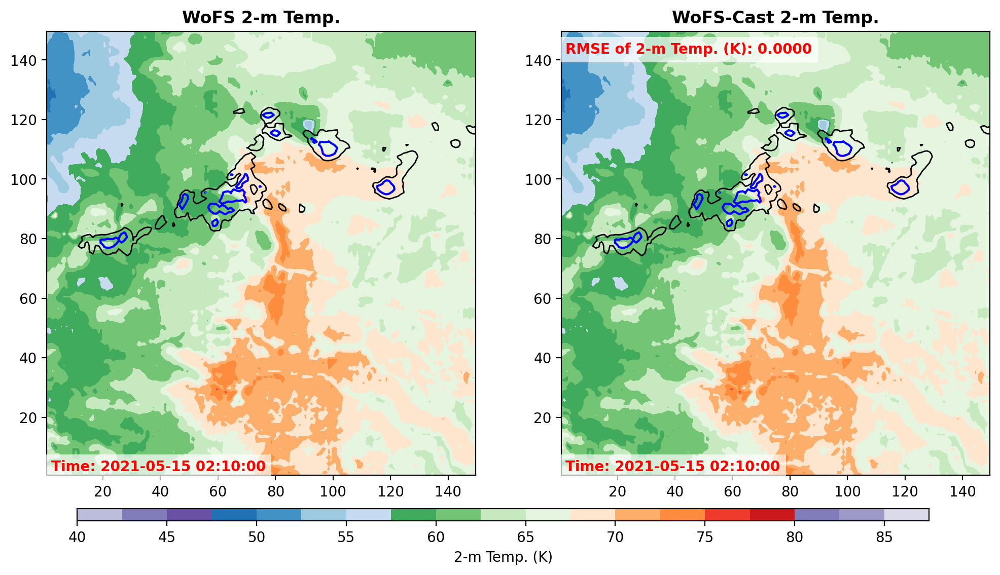

In [8]:
animator = WoFSCastAnimator(domain_size=150, dts=dts)
anim = animator(
                #var='COMPOSITE_REFL_10CM', 
                #var = 'W', 
                var = 'T2',
                level='none',
                inputs=inputs, 
                predictions=predictions, 
                targets=targets, 
                mrms_dz = mrms_dz
               )

# To display the animation in a Jupyter notebook
from IPython.display import HTML
HTML(anim.to_jshtml())

# Optionally, to save the animation
#anim.save("wofscast_5min_w_max.gif", writer="pillow", fps=3)   

## Plot Target Residuals

## Plot Cross-Sections

In [9]:
def compute_and_add_horizontal_divergence(dataset):
    """
    Computes horizontal convergence from the u and v wind components and adds it as a new variable to the dataset.
    
    Parameters:
    - dataset: xarray.Dataset with 'u' and 'v' wind components and coordinates (time, level, lat, lon)
    
    Returns:
    - dataset: xarray.Dataset with the computed horizontal convergence added as a new variable 'convergence'
    """
    # Extract the wind components
    u = dataset['U']
    v = dataset['V']
    
    # Compute the partial derivatives
    du_dx = u.differentiate('lon')  # Partial derivative of u with respect to longitude
    dv_dy = v.differentiate('lat')  # Partial derivative of v with respect to latitude
    
    # Compute divergence
    divergence = du_dx + dv_dy
    
    # Add convergence to the dataset
    dataset = dataset.assign(divergence=divergence)
    
    return dataset

In [ ]:
import matplotlib.colors as mcolors
lat = 80
# Plot cross-sections 
fig, ax = plt.subplots(dpi=100, figsize=(6,5))

ax_twin = ax.twinx()

lon_rng = np.arange(25,150)

targets_with_div = compute_and_add_horizontal_divergence(targets)

# Define boundaries and colormap
boundaries = np.linspace(np.percentile(targets['W'], 0.0001), np.percentile(targets['W'], 99.999), 100)
cmap = plt.get_cmap('coolwarm')

# Create a BoundaryNorm
norm = mcolors.BoundaryNorm(boundaries, cmap.N, extend='both')

div_levels = np.linspace(np.percentile(targets_with_div['divergence'], 0.0001), 
                         np.percentile(targets_with_div['divergence'], 99.999), 
                         10)
def update(t):
    ax.clear()
    ax_twin.clear()
    
    max_cross_section_ds = targets_with_div.isel(batch=0, time=t, lon=lon_rng).max(dim='lat')
    cross_section_ds = targets_with_div.isel(batch=0, time=t, lat=lat, lon=lon_rng)
    
    max_cross_section_ds = max_cross_section_ds.transpose('lon', 'level')
    cross_section_ds = cross_section_ds.transpose('lon', 'level')
    
    w_vals = max_cross_section_ds['W'].values
    cf = ax.pcolormesh(w_vals.T, norm=norm, cmap=cmap, alpha=0.8)#, levels=[-1.0, 2.5, 5, 10, 15])

    ax.contour(cross_section_ds['T'].T, linestyles='dashed', levels = np.linspace(250,650,25))

    x,y = cross_section_ds['lon'].values, cross_section_ds['level'].values

    cl = ax.contour(cross_section_ds['divergence'].T, linestyles='dashed', cmap='jet', levels=div_levels)
    
    ax_twin.plot(cross_section_ds['RAIN_AMOUNT'], color='k')
    ax_twin.plot(cross_section_ds['COMPOSITE_REFL_10CM'], color='r')
    ax_twin.set_ylim([0, 55])
    ax.annotate(f'Time : {t*10} mins', xy=(0.05, 0.95), xycoords='axes fraction')
    #ax_twin.set_ylabel('Rain Rate (in.)')
    
    
# Create the animation
ani = FuncAnimation(fig, update, frames=targets_with_div.dims['time'])

# To display the animation in a Jupyter notebook
HTML(ani.to_jshtml())

# Optionally, to save the animation
#ani.save("wofscast-cross-section_1.gif", writer="pillow", fps=3) 

In [ ]:
import matplotlib.colors as mcolors

# Plot cross-sections 
fig, ax = plt.subplots(dpi=100, figsize=(6,5))

ax_twin = ax.twinx()

lon_rng = np.arange(25,150)

predictions_with_div = compute_and_add_horizontal_divergence(predictions)


# Define boundaries and colormap
boundaries = np.linspace(np.percentile(targets['W'], 0.0001), np.percentile(targets['W'], 99.999), 100)
cmap = plt.get_cmap('coolwarm')

# Create a BoundaryNorm
norm = mcolors.BoundaryNorm(boundaries, cmap.N, extend='both')

div_levels = np.linspace(np.percentile(targets_with_div['divergence'], 0.0001), 
                         np.percentile(targets_with_div['divergence'], 99.999), 
                         10)
def update(t):
    ax.clear()
    ax_twin.clear()
    
    max_cross_section_ds = predictions_with_div.isel(batch=0, time=t, lon=lon_rng).max(dim='lat')
    cross_section_ds = predictions_with_div.isel(batch=0, time=t, lat=lat, lon=lon_rng)
    
    max_cross_section_ds = max_cross_section_ds.transpose('lon', 'level')
    cross_section_ds = cross_section_ds.transpose('lon', 'level')
    
    w_vals = max_cross_section_ds['W'].values
    cf = ax.pcolormesh(w_vals.T, norm=norm, cmap=cmap, alpha=0.8)#, levels=[-1.0, 2.5, 5, 10, 15])

    ax.contour(cross_section_ds['T'].T, linestyles='dashed', levels = np.linspace(250,650,25))

    cl = ax.contour(cross_section_ds['divergence'].T, linestyles='dashed', cmap='jet', levels=div_levels)
    
    ax_twin.plot(cross_section_ds['RAIN_AMOUNT'], color='k')
    ax_twin.plot(cross_section_ds['COMPOSITE_REFL_10CM'], color='r')
    ax_twin.set_ylim([0, 55])
    ax.annotate(f'Time : {t*10} mins', xy=(0.05, 0.95), xycoords='axes fraction')
    #ax_twin.set_ylabel('Rain Rate (in.)')
    
    
# Create the animation
ani = FuncAnimation(fig, update, frames=predictions_with_div.dims['time'])

# To display the animation in a Jupyter notebook
HTML(ani.to_jshtml())

# Optionally, to save the animation
#ani.save("wofscast-cross-section_5min.gif", writer="pillow", fps=3) 